#  <center> <span style="color:blue">   </span> <center> <center><span style="color:blue">Filtrage spatial - Convolution</span></center>

### <center>Réaliser par : Jihen Fennani </center>

In [1]:
!pip install opencv-python

## 1. Degradations dans une image

La qualité d'une image peut être affectée à divers stades : lors de son acquisition, pendant sa transmission, ou au cours de sa compression. Le traitement d'image cherche principalement à identifier, traiter, et corriger ces dégradations pour améliorer la qualité visuelle de l'image. Nous nous focalisons ici sur deux types de dégradations fréquemment rencontrées :

- **Bruit gaussien :** Il s'agit d'une perturbation qui impacte l'ensemble des pixels de l'image, se manifestant sous forme d'un voile granuleux sur celle-ci. Pour ce TP, nous considérons un modèle de bruit gaussien additif blanc, caractérisé par une moyenne nulle et une variance σ². Ce modèle est largement reconnu pour sa capacité à simuler de manière réaliste le bruit introduit lors de l'acquisition d'images. La sévérité du bruit gaussien est directement liée à sa variance σ² : une valeur plus élevée de σ² indique une image fortement dégradée.

- **Bruit impulsionnel ("sel et poivre") :** Ce type de bruit affecte aléatoirement certains pixels en les rendant soit complètement blancs (sel), soit totalement noirs (poivre), créant ainsi des perturbations visuellement distinctes. Ce bruit peut être causé par divers facteurs, tels que des erreurs de transmission, des défaillances des capteurs CCD, ou la présence de particules sur le capteur. Le degré de dégradation induit par le bruit impulsionnel est mesuré par le pourcentage \(p\) de pixels altérés : plus le pourcentage \(p\) est important, plus l'impact sur la qualité de l'image est conséquent.


C:\Users\Dell\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


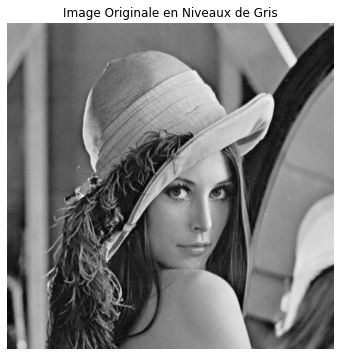

In [2]:
from skimage import io, color, util
from skimage.util import random_noise
import matplotlib.pyplot as plt

# Charger l'image Lena.png (remplacer par le chemin correct si nécessaire)
# Pour cet exemple, nous supposons que l'image est déjà en niveaux de gris ou nous la convertissons.
image_path = 'E:/RT4/S2/Traitement dimage/Lena.png'  # Exemple de chemin, nécessite d'être ajusté selon l'environnement

# Charger et afficher l'image originale
imGray = io.imread(image_path)

# Vérifier si l'image est en couleur et la convertir en niveaux de gris si nécessaire
if imGray.ndim == 3:
    imGray = color.rgb2gray(imGray)

# Afficher l'image en niveaux de gris
plt.figure(figsize=(6, 6))
plt.imshow(imGray, cmap='gray')
plt.title("Image Originale en Niveaux de Gris")
plt.axis('off')
plt.show()


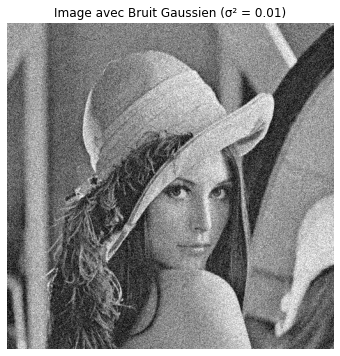

In [3]:
# Appliquer un bruit blanc gaussien avec une variance de 0.01
sigma = 0.01
imGauss = random_noise(imGray, mode='gaussian', var=sigma)

# Afficher l'image avec bruit gaussien
plt.figure(figsize=(6, 6))
plt.imshow(imGauss, cmap='gray')
plt.title(f"Image avec Bruit Gaussien (σ² = {sigma})")
plt.axis('off')
plt.show()


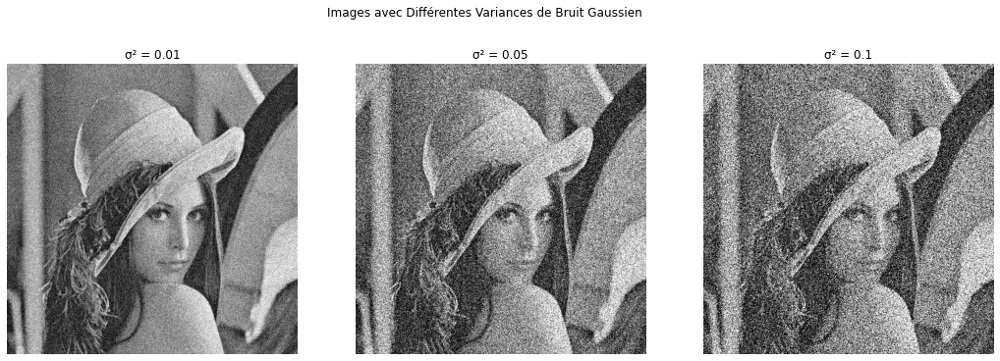

In [4]:
# Appliquer le bruit gaussien avec différentes valeurs de variance
variances = [0.01, 0.05, 0.1]  # Exemples de variances à tester
images_gauss = [random_noise(imGray, mode='gaussian', var=v) for v in variances]

# Afficher les images avec différentes variances
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for ax, img, var in zip(axes, images_gauss, variances):
    ax.imshow(img, cmap='gray')
    ax.title.set_text(f'σ² = {var}')
    ax.axis('off')
plt.suptitle('Images avec Différentes Variances de Bruit Gaussien')
plt.show()


Lors du bruitage d'une image avec du bruit gaussien, le paramètre 
σ  représente l'écart-type du bruit et joue un rôle crucial dans la quantité de bruit ajoutée à l'image.<br>
Plus la valeur de σ est élevée, plus le bruit ajouté à l'image est important, ce qui peut réduire considérablement la qualité visuelle et la lisibilité de l'image.

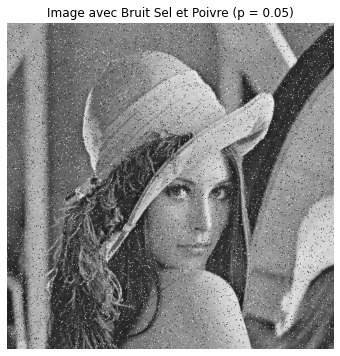

In [5]:
# Appliquer un bruit sel et poivre avec un pourcentage p = 0.05 de pixels modifiés
p = 0.05
imSP = random_noise(imGray, mode='s&p', amount=p)

# Afficher l'image avec bruit sel et poivre
plt.figure(figsize=(6, 6))
plt.imshow(imSP, cmap='gray')
plt.title(f"Image avec Bruit Sel et Poivre (p = {p})")
plt.axis('off')
plt.show()


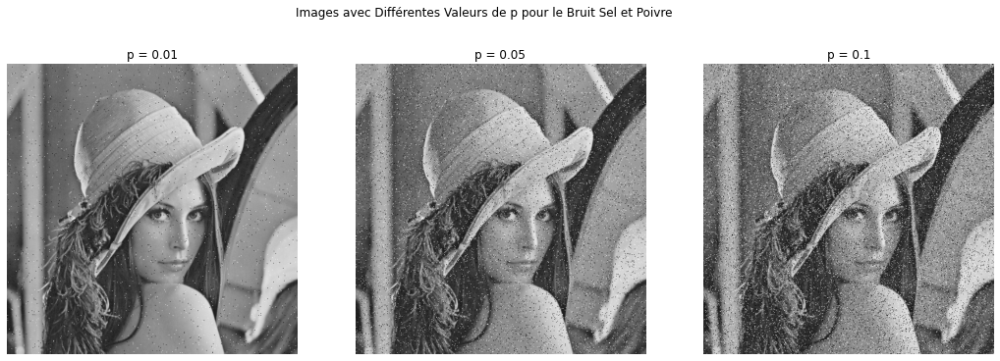

In [6]:

# Appliquer le bruit sel et poivre avec différentes valeurs de p
percentages = [0.01, 0.05, 0.1]  # Exemples de pourcentages à tester
images_sp = [random_noise(imGray, mode='s&p', amount=perc) for perc in percentages]

# Afficher les images avec différentes valeurs de p
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for ax, img, perc in zip(axes, images_sp, percentages):
    ax.imshow(img, cmap='gray')
    ax.title.set_text(f'p = {perc}')
    ax.axis('off')
plt.suptitle('Images avec Différentes Valeurs de p pour le Bruit Sel et Poivre')
plt.show()


L'effet du paramètre p dans le bruit "sel et poivre" est direct et significatif : plus la valeur de p est élevée, plus le nombre de pixels affectés est important, ce qui détériore la qualité de l'image.
- p=0.01 : à ce niveau, 1% des pixels de l'image sont aléatoirement affectés par le bruit "sel et poivre". Cela signifie que l'image restera largement reconnaissable avec la plupart de ses détails intacts.
- p=0.05: 5% des pixels de l'image sont affectés, augmentant sensiblement la quantité de bruit. À ce stade, le bruit devient plus visible et peut commencer à masquer certains détails fins de l'image. 
- p=0.1 : 10% des pixels de l'image sont aléatoirement convertis en blanc ou en noir. Ce niveau de bruit est très élevé et aura un impact considérable sur la qualité visuelle de l'image. 

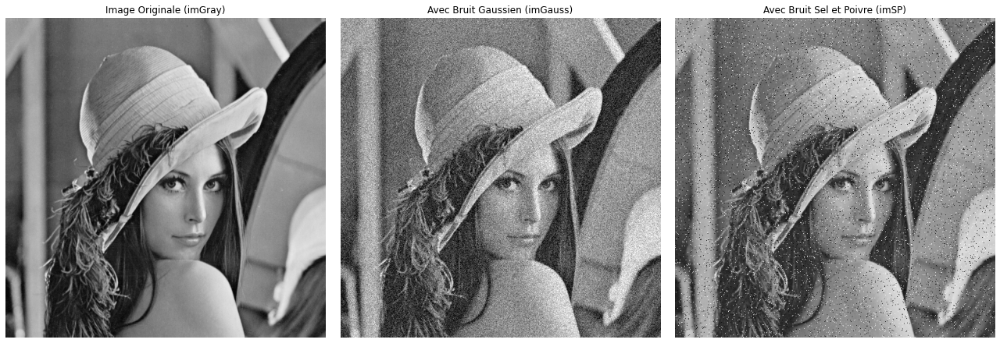

In [7]:
# Afficher les images imGray, imGauss et imSP côte à côte pour comparaison
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(imGray, cmap='gray')
axes[0].set_title("Image Originale (imGray)")
axes[1].imshow(imGauss, cmap='gray')
axes[1].set_title("Avec Bruit Gaussien (imGauss)")
axes[2].imshow(imSP, cmap='gray')
axes[2].set_title("Avec Bruit Sel et Poivre (imSP)")

for ax in axes:
    ax.axis('off')
plt.tight_layout()
plt.show()



## 2. Filtrage spatial d’une image

Le filtrage est une opération qui permet de transformer une image en une nouvelle version possédant des caractéristiques spatiales et fréquentielles modifiées. Il se décline en deux principaux types :

- **Filtrage linéaire :** Cette méthode repose sur une convolution bidimensionnelle qui modifie l'image originale en une autre, habituellement de dimension identique. Elle s'appuie sur un noyau ou masque de convolution, désigné par \(h(m, n)\), ayant des dimensions \(M_h \times N_h\) (où \(M_h = N_h\) est courant). Dans ce cadre, la valeur de chaque pixel est recalculée en fonction d'une moyenne pondérée des pixels avoisinants, déterminée par les poids spécifiés dans le masque.

- **Filtrage non linéaire :** Utilisé pour réduire des bruits spécifiques, ce type de filtrage ajuste également la valeur de chaque pixel d'après ses voisins, mais par une approche non linéaire, telle que l'opération de médiane, contrastant ainsi avec la méthode linéaire de moyenne pondérée. Ces filtres sont particulièrement efficaces pour éliminer certains types de perturbations dans l'image sans recourir à une convolution traditionnelle.


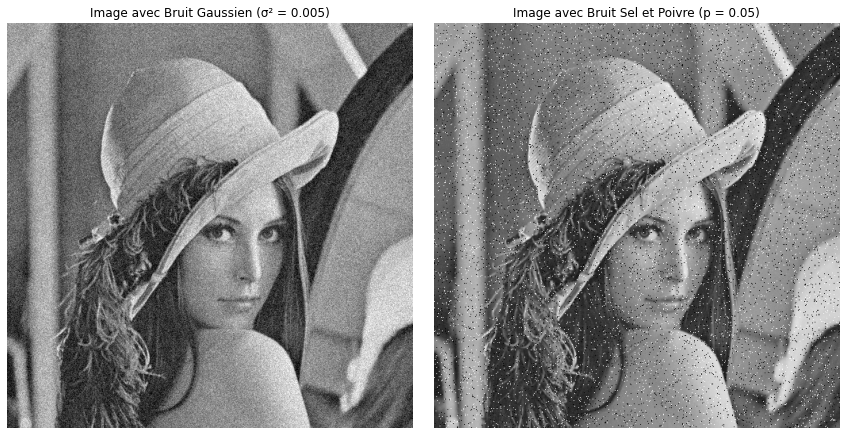

In [28]:
# Réappliquer le bruit gaussien avec une variance de 0.005 pour imGauss
sigma = 0.005
imGauss_new = random_noise(imGray, mode='gaussian', var=sigma)

# Réappliquer le bruit sel et poivre avec un pourcentage p = 0.05 pour imSP
p = 0.05
imSP_new = random_noise(imGray, mode='s&p', amount=p)

# Afficher les images imGauss et imSP avec les nouveaux paramètres pour vérification
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(imGauss_new, cmap='gray')
axes[0].set_title(f"Image avec Bruit Gaussien (σ² = {sigma})")
axes[1].imshow(imSP_new, cmap='gray')
axes[1].set_title(f"Image avec Bruit Sel et Poivre (p = {p})")

for ax in axes:
    ax.axis('off')
plt.tight_layout()
plt.show()


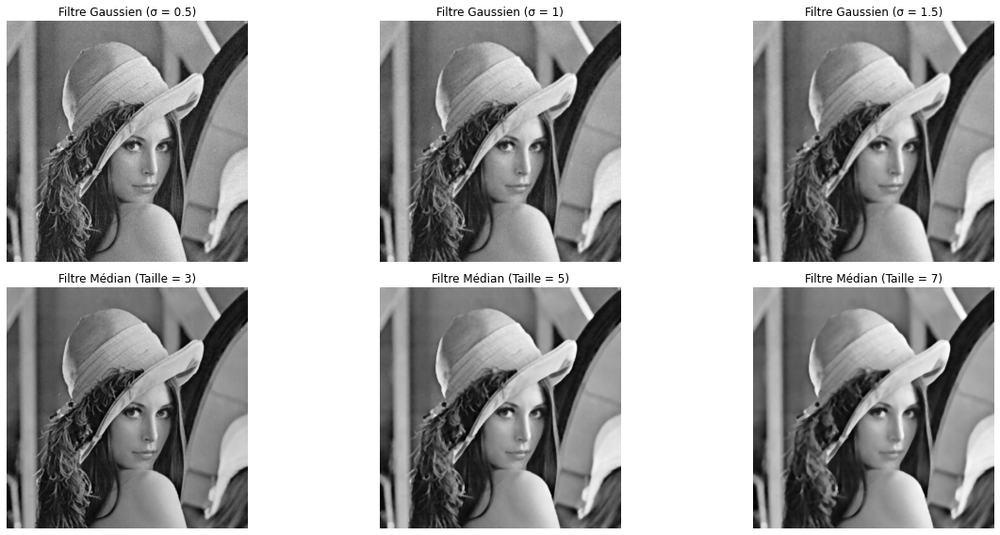

In [27]:
from skimage.filters import gaussian
from skimage.morphology import disk
from skimage.filters.rank import median
import cv2
import numpy as np
from skimage import img_as_float


kernel_sizes = [3, 5, 7]

sigma_values = [0.5, 1, 1.5]
imGauss_new = (imGauss_new * 255).astype(np.uint8)
imSP_new = (imSP_new * 255).astype(np.uint8)

# Appliquer les filtres sur l'image bruitée gaussienne
filtered_gauss_images= [cv2.GaussianBlur(imGauss_new, ksize=(0, 0), sigmaX=sigma) for sigma in sigma_values]

# Appliquer les filtres sur l'image bruitée sel et poivre
filtered_sp_images = [cv2.medianBlur(imSP_new, ksize=size) for size in [3, 5, 7]]

# Affichage des images filtrées
fig, axes = plt.subplots(2, max(len(kernel_sizes), len(sigma_values)), figsize=(18, 8))
for ax, img, sigma in zip(axes[0], filtered_gauss_images, sigma_values):
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Filtre Gaussien (σ = {sigma})")
    ax.axis('off')

for ax, img, size in zip(axes[1], filtered_sp_images, kernel_sizes):
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Filtre Médian (Taille = {size})")
    ax.axis('off')

axes[0, 0].set_ylabel("Bruit Gaussien")
axes[1, 0].set_ylabel("Bruit Sel et Poivre")
plt.tight_layout()
plt.show()


Gaussien σ=0.5 - MSE: 3.85, PSNR: 40.99 dB
Gaussien σ=1 - MSE: 31.16, PSNR: 31.91 dB
Gaussien σ=1.5 - MSE: 61.76, PSNR: 28.94 dB
Médian Taille=3 - MSE: 21.73, PSNR: 33.48 dB
Médian Taille=5 - MSE: 50.00, PSNR: 29.86 dB
Médian Taille=7 - MSE: 80.66, PSNR: 27.78 dB


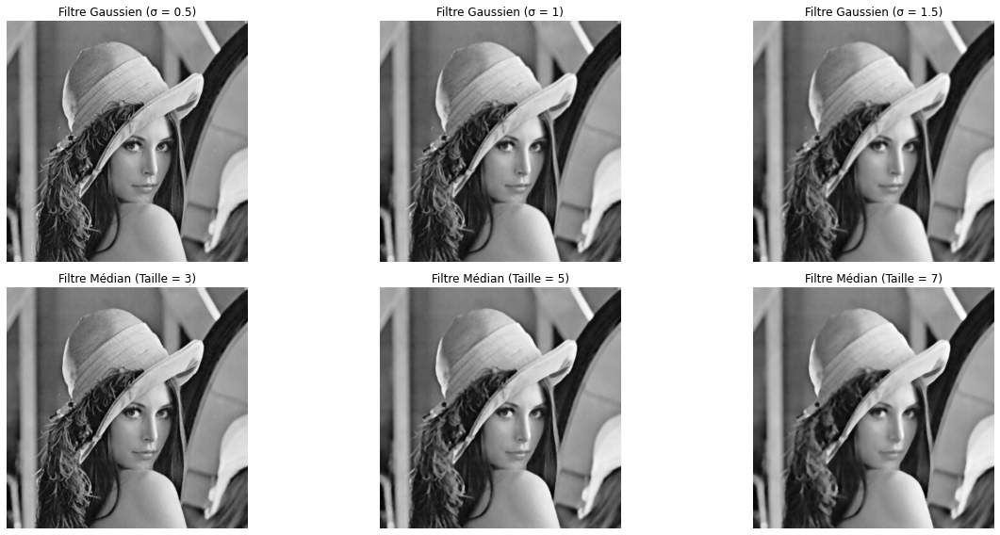

In [13]:
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse
import matplotlib.pyplot as plt

# Supposons que imGray_dummy est l'image originale sans bruit pour ces calculs
image_originale = imGray

# Affichage des images filtrées et calcul des métriques pour chaque image
fig, axes = plt.subplots(2, max(len(kernel_sizes), len(sigma_values)), figsize=(18, 8))

# Pour les images filtrées par le filtre gaussien
for ax, img, sigma in zip(axes[0], filtered_gauss_images, sigma_values):
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Filtre Gaussien (σ = {sigma})")
    ax.axis('off')
    # Calculer MSE et PSNR pour chaque image filtrée individuellement
    mse_value = mse(image_originale, img)
    psnr_value = psnr(image_originale, img, data_range=image_originale.max() - image_originale.min())
    print(f"Gaussien σ={sigma} - MSE: {mse_value:.2f}, PSNR: {psnr_value:.2f} dB")

# Pour les images filtrées par le filtre médian
for ax, img, size in zip(axes[1], filtered_sp_images, kernel_sizes):
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Filtre Médian (Taille = {size})")
    ax.axis('off')
    # Calculer MSE et PSNR pour chaque image filtrée individuellement
    mse_value = mse(image_originale, img)
    psnr_value = psnr(image_originale, img, data_range=image_originale.max() - image_originale.min())
    print(f"Médian Taille={size} - MSE: {mse_value:.2f}, PSNR: {psnr_value:.2f} dB")

axes[0, 0].set_ylabel("Bruit Gaussien")
axes[1, 0].set_ylabel("Bruit Sel et Poivre")

plt.tight_layout()
plt.show()


 - Le MSE mesure l'erreur moyenne carrée entre l'image originale et l'image traitée.Plus le MSE est bas, meilleure est la qualité perçue de l'image traitée
 - Un PSNR élevé indique une différence minime entre l'image originale et l'image traitée, donc une meilleure qualité.<br>
Les filtres gaussiens avec des valeurs σ plus basses et les filtres médians de petite taille tendent à préserver mieux les détails et la qualité générale de l'image.<br>
À l'inverse, des valeurs σ plus élevées pour le filtre gaussien et des tailles plus grandes pour le filtre médian augmentent l'efficacité de la réduction du bruit mais au prix d'une perte significative de détails.<br>
Le meilleure c'est le filtre gausien de  σ=0.5 avec  MSE =3.85 et  PSNR= 40.99 dB

# 3. Methodes à base de patch : moyenne non locale 

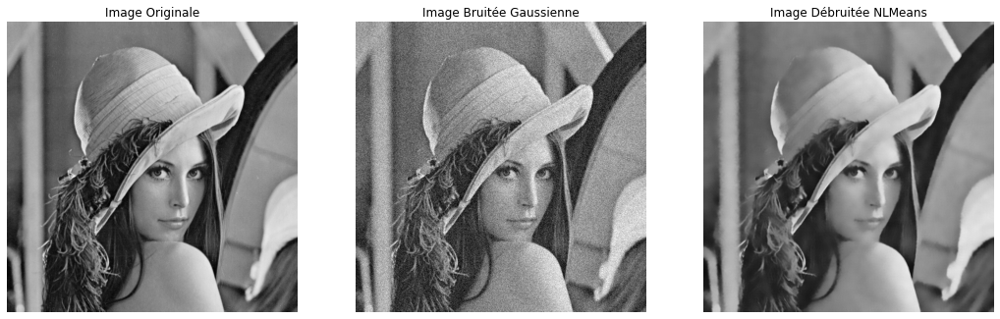

 NLMeans:  MSE: 17537.67, PSNR: 4.41 dB


In [46]:
from skimage import io, color, util
from skimage.util import random_noise
from skimage import restoration, img_as_float
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse
sigma = 0.005
imGauss = random_noise(imGray, mode='gaussian', var=sigma)

# Appliquer le filtre NLMeans à l'image bruitée
# Les paramètres patch_size, patch_distance et h peuvent nécessiter des ajustements
patch_kw = dict(patch_size=5,      # Taille des patches
                patch_distance=6,  # Taille de la région de recherche
                h=0.1)             # Paramètre de décision pour la similitude

im_denoised = restoration.denoise_nl_means(imGauss, **patch_kw)

# Afficher les images
plt.figure(figsize=(18, 6))

plt.subplot(131)
plt.imshow(imGray, cmap='gray')
plt.title('Image Originale')
plt.axis('off')

plt.subplot(132)
plt.imshow(imGauss, cmap='gray')
plt.title('Image Bruitée Gaussienne')
plt.axis('off')

plt.subplot(133)
plt.imshow(im_denoised, cmap='gray')
plt.title('Image Débruitée NLMeans')
plt.axis('off')

plt.show()

# Calculer MSE et PSNR pour chaque image filtrée individuellement
mse_value = mse(imGray, im_denoised)
psnr_value = psnr(imGray, im_denoised, data_range=imGray.max() - imGray.min())
print(f" NLMeans:  MSE: {mse_value:.2f}, PSNR: {psnr_value:.2f} dB")


C:\Users\Dell\AppData\Local\Temp/ipykernel_13524/2511461429.py:23: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im_true.
  psnr_nlm= psnr(imGray, im_denoised_nlm)
C:\Users\Dell\AppData\Local\Temp/ipykernel_13524/2511461429.py:26: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im_true.
  psnr_gaussian= psnr(imGray, im_denoised_gaussian)
C:\Users\Dell\AppData\Local\Temp/ipykernel_13524/2511461429.py:29: UserWarning: Inputs have mismatched dtype.  Setting data_range based on im_true.
  psnr_mean= psnr(imGray, im_denoised_mean)


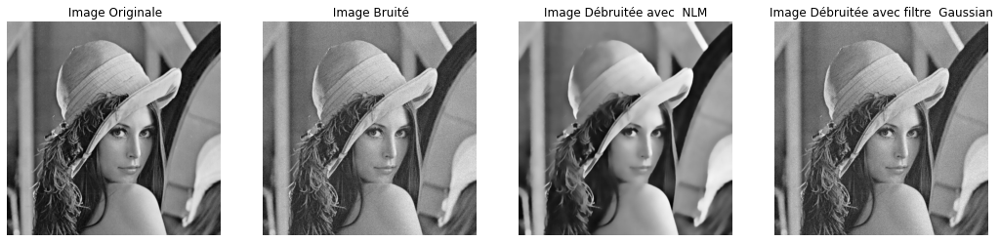

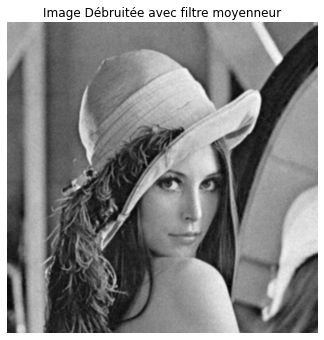

NLM : PSNR: 5.69 dB, MSE: 17537.71
Gaussian : PSNR: 5.69 dB, MSE: 17536.97
Mean : PSNR: 5.69 dB, MSE: 17537.43


In [58]:
from skimage import io, color, util, restoration, metrics
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.filters import gaussian
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse
sigma = 0.001
imGauss = random_noise(imGray, mode='gaussian', var=sigma)

# Apply Gaussian filter
im_denoised_gaussian =cv2.GaussianBlur(imGauss, ksize=(0, 0), sigmaX=0.001)

# Apply mean filter
ksize = 3  # The kernel size should be an odd number
im_denoised_mean = cv2.blur(imGauss, (ksize, ksize))

## Appliquer le filtre NLMeans à l'image bruitée
im_denoised_nlm = im_denoised

# Calculate PSNR and MSE for the denoised images compared to the original image
mse_nlm =  mse(imGray, im_denoised_nlm)
psnr_nlm= psnr(imGray, im_denoised_nlm)

mse_gaussian  =  mse(imGray, im_denoised_gaussian)
psnr_gaussian= psnr(imGray, im_denoised_gaussian)

mse_mean  =  mse(imGray, im_denoised_mean)
psnr_mean= psnr(imGray, im_denoised_mean)

# Display images
plt.figure(figsize=(18, 6))

# Original Image
plt.subplot(1,4 , 1)
plt.imshow(imGray, cmap='gray')
plt.title(' Image Originale')
plt.axis('off')

# Noisy Image
plt.subplot(1, 4, 2)
plt.imshow(imGauss, cmap='gray')
plt.title(' Image Bruité')
plt.axis('off')

# Denoised with NLM
plt.subplot(1, 4, 3)
plt.imshow(im_denoised_nlm, cmap='gray')
plt.title('Image Débruitée avec  NLM')
plt.axis('off')

# Denoised with Gaussian
plt.subplot(1, 4, 4)
plt.imshow(im_denoised_gaussian, cmap='gray')
plt.title('Image Débruitée avec filtre  Gaussian')
plt.axis('off')

# Denoised with Mean
plt.figure(figsize=(18, 6))
plt.subplot(1, 4, 4)
plt.imshow(im_denoised_mean, cmap='gray')
plt.title('Image Débruitée avec filtre moyenneur')
plt.axis('off')

plt.tight_layout()
plt.show()

# Print out the PSNR and MSE values
print(f"NLM : PSNR: {psnr_nlm:.2f} dB, MSE: {mse_nlm:.2f}")
print(f"Gaussian : PSNR: {psnr_gaussian:.2f} dB, MSE: {mse_gaussian:.2f}")
print(f"Mean : PSNR: {psnr_mean:.2f} dB, MSE: {mse_mean:.2f}")



## Comparaison les méthodes NLM ,  Filtrage Linéaire et non Linéaire

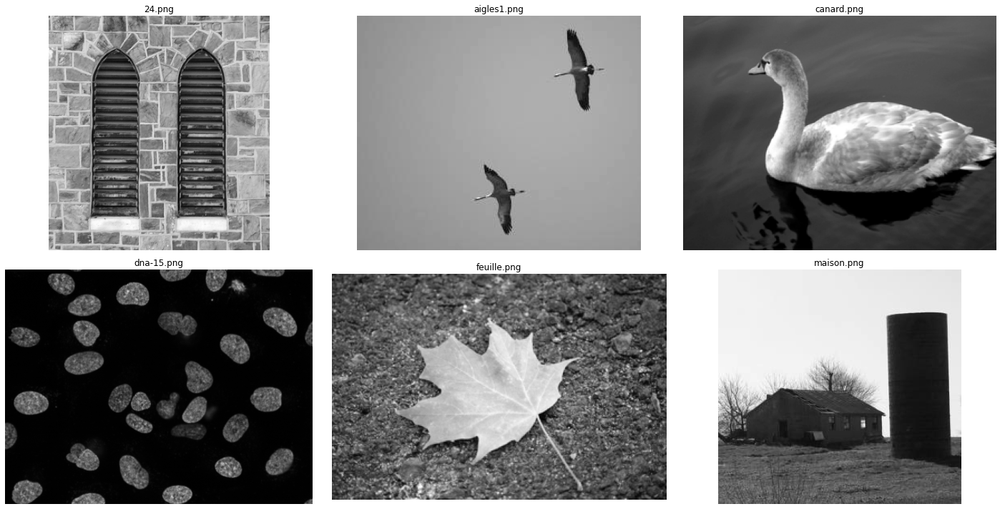

In [68]:
import cv2 as cv
import os

# Path where the images are located
path = r"E:/RT4/S2/Traitement dimage/TP3"

# List of filenames for the images you've uploaded
filenames = ['24.png', 'aigles1.png', 'canard.png', 'dna-15.png', 'feuille.png', 'maison.png']

# Dictionary to hold the images
images = {}

# Reading each image in grayscale and storing it in the dictionary
for filename in filenames:
    img_path = os.path.join(path, filename)
    images[filename] = cv.imread(img_path, cv.IMREAD_GRAYSCALE)

# Display each image
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
for ax, (name, image) in zip(axes.flatten(), images.items()):
    ax.imshow(image, cmap='gray')
    ax.axis('off')
    ax.set_title(name)
plt.tight_layout()
plt.show()


### Bruité les images en bruit gaussien 

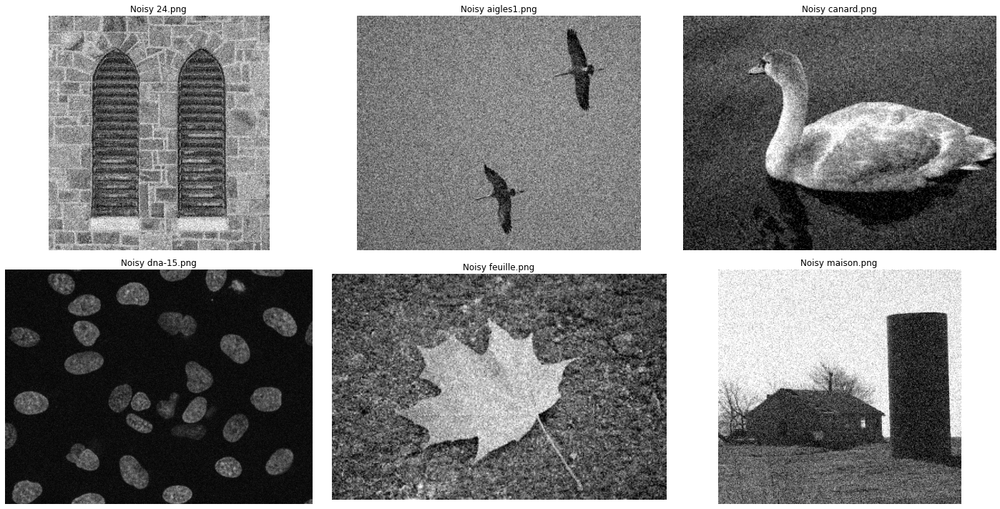

In [81]:
from skimage.util import random_noise
import matplotlib.pyplot as plt

# Apply Gaussian noise with sigma = 0.01 to each grayscale image
gaussian_noisy_images = {}

for name, image in images.items():
    # Apply noise with variance sigma^2
    sigma = 0.01
    noisy_img = random_noise(image, mode='gaussian', var=sigma)
    
    # Convert the image from float [0,1] to uint8 [0,255] as random_noise returns a float image
    noisy_img_uint8 = (255 * noisy_img).astype('uint8')
    gaussian_noisy_images[name] = noisy_img_uint8

# Display each noisy image
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
for ax, (name, image) in zip(axes.flatten(), gaussian_noisy_images.items()):
    ax.imshow(image, cmap='gray')
    ax.axis('off')
    ax.set_title(f'Noisy {name}')
plt.tight_layout()
plt.show()



### Filtrage Linéaire : Filtre Gaussien 

Le filtre gaussien est un filtre linéaire qui lisse l'image et atténue le bruit gaussien, en appliquant un poids plus important aux pixels proches du pixel central selon une distribution gaussienne. Son écart-type 
(σ) détermine l'intensité du lissage. 

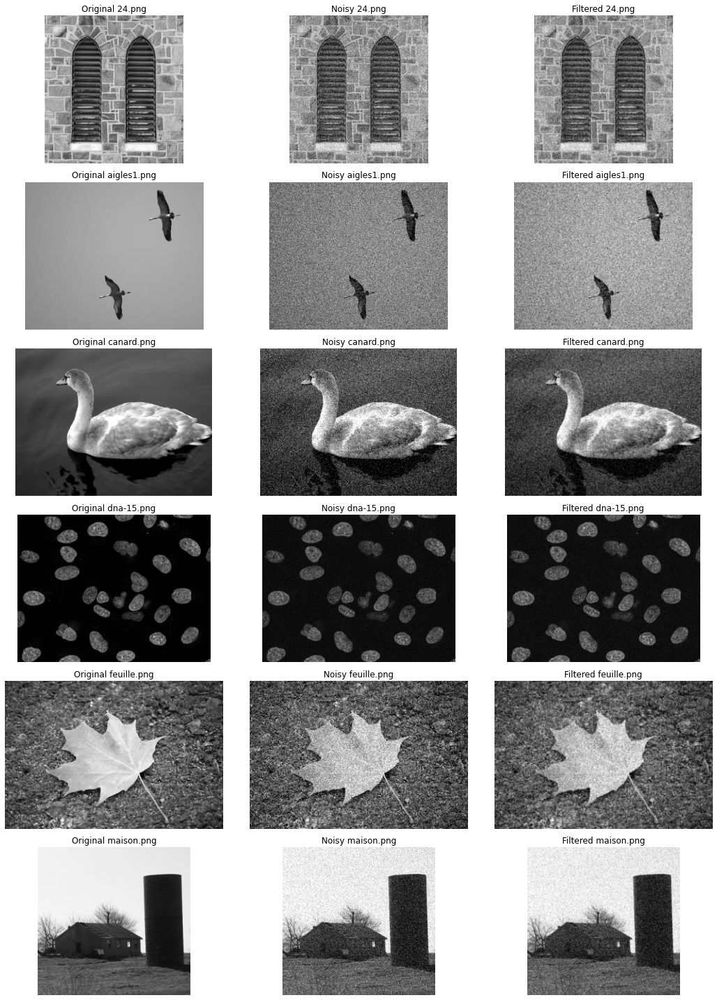

In [82]:
# Apply Gaussian filter with sigma = 0.5 to each noisy image
filtered_gauss_images = {}

for name, noisy_image in gaussian_noisy_images.items():
    # Apply Gaussian filter
    filtered_img = cv2.GaussianBlur(noisy_image, (0, 0), sigmaX=0.5)
    filtered_gauss_images[name] = filtered_img

# Display each original, noisy, and filtered image side by side
fig, axes = plt.subplots(len(images), 3, figsize=(15, 20))

for i, (name, image) in enumerate(images.items()):
    # Original image
    if len(image.shape) == 2:  # If grayscale
        axes[i, 0].imshow(image, cmap='gray')
    else:  # If color, convert to grayscale for display
        axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), cmap='gray')
    axes[i, 0].set_title(f'Original {name}')
    axes[i, 0].axis('off')
    
    # Noisy image
    axes[i, 1].imshow(gaussian_noisy_images[name], cmap='gray')
    axes[i, 1].set_title(f'Noisy {name}')
    axes[i, 1].axis('off')
    
    # Filtered image
    axes[i, 2].imshow(filtered_gauss_images[name], cmap='gray')
    axes[i, 2].set_title(f'Filtered {name}')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


### Calcule PSNR et MSE 

In [85]:
import numpy as np

def mse(original, denoised):
    """Compute the Mean Squared Error between two images."""
    return np.mean((original - denoised) ** 2)

def psnr(original, denoised):
    """Compute the Peak Signal to Noise Ratio between two images."""
    mse_value = mse(original, denoised)
    if mse_value == 0:
        return float('inf')
    return 20 * np.log10(255.0 / np.sqrt(mse_value))


In [95]:
# Calculate PSNR and MSE for each image
psnr_values_gauss = {}
mse_values_gauss = {}

for name, original_image in images.items():
    original_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY) if len(original_image.shape) > 2 else original_image
    denoised_image_gauss = filtered_gauss_images[name]
    psnr_values_gauss[name] = psnr(original_gray, denoised_image_gauss)
    mse_values_gauss[name] = mse(original_gray, denoised_image_gauss)

# Display the PSNR and MSE values for each image
for name in images.keys():
    print(f"{name}: PSNR_gauss = {psnr_values_gauss[name]:.2f}, MSE_gauss = {mse_values_gauss[name]:.2f}")

24.png: PSNR_gauss = 29.00, MSE_gauss = 81.91
aigles1.png: PSNR_gauss = 29.02, MSE_gauss = 81.50
canard.png: PSNR_gauss = 29.12, MSE_gauss = 79.56
dna-15.png: PSNR_gauss = 30.27, MSE_gauss = 61.12
feuille.png: PSNR_gauss = 28.96, MSE_gauss = 82.70
maison.png: PSNR_gauss = 29.26, MSE_gauss = 77.17


### Filtrage Non Linéaire : Filtre Médian

Le filtre médian, un filtre non linéaire, réduit le bruit, particulièrement le bruit de type sel et poivre, en remplaçant chaque pixel par la valeur médiane de son voisinage, préservant ainsi les bords et les détails de l'image. 

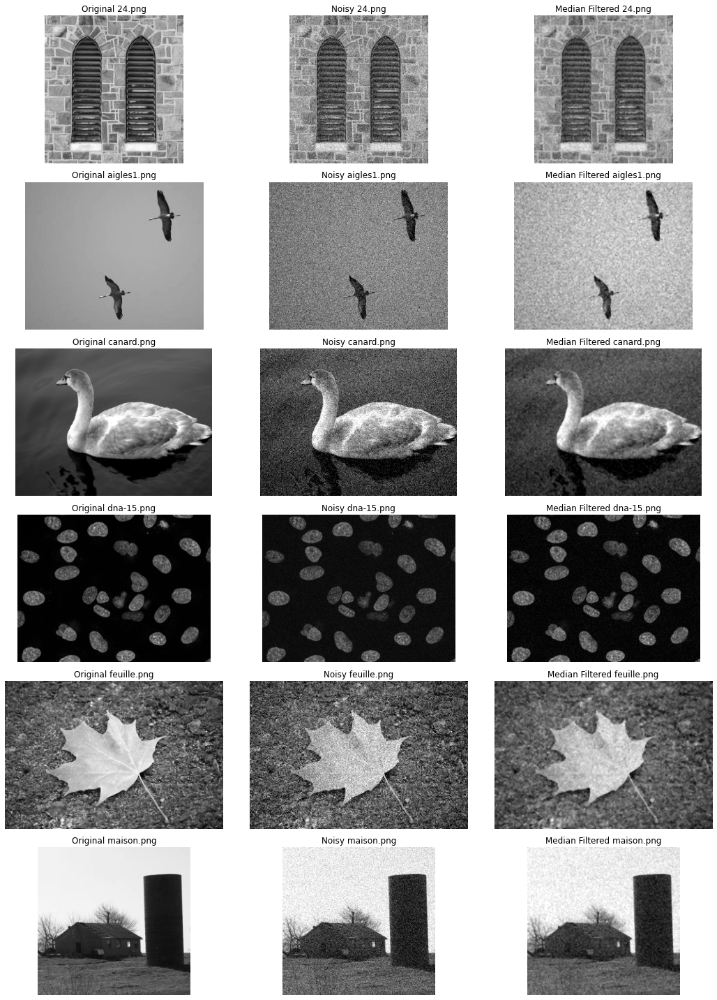

In [84]:
# Apply median filter with kernel size 3x3 to each noisy image
filtered_median_images = {}

for name, noisy_image in gaussian_noisy_images.items():
    # Apply median filter
    median_filtered_img = cv2.medianBlur(noisy_image, ksize=3)
    filtered_median_images[name] = median_filtered_img

# Display each original, noisy, and median filtered image side by side
fig, axes = plt.subplots(len(images), 3, figsize=(15, 20))

for i, (name, image) in enumerate(images.items()):
    # Original image
    axes[i, 0].imshow(image if len(image.shape) == 2 else cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), cmap='gray')
    axes[i, 0].set_title(f'Original {name}')
    axes[i, 0].axis('off')
    
    # Noisy image
    axes[i, 1].imshow(gaussian_noisy_images[name], cmap='gray')
    axes[i, 1].set_title(f'Noisy {name}')
    axes[i, 1].axis('off')
    
    # Median filtered image
    axes[i, 2].imshow(filtered_median_images[name], cmap='gray')
    axes[i, 2].set_title(f'Median Filtered {name}')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


### Calcule PSNE et MSE 

In [93]:
# Calculate PSNR and MSE for each image
psnr_values_median = {}
mse_values_median = {}

for name, original_image in images.items():
    original_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY) if len(original_image.shape) > 2 else original_image
    denoised_image_median = filtered_median_images[name]
    psnr_values_median[name] = psnr(original_gray, denoised_image_median)
    mse_values_median[name] = mse(original_gray, denoised_image_median)

# Display the PSNR and MSE values for each image
for name in images.keys():
    print(f"{name}: PSNR_median = {psnr_values_median[name]:.2f}, MSE_median = {mse_values_median[name]:.2f}")

24.png: PSNR_median = 29.47, MSE_median = 73.55
aigles1.png: PSNR_median = 30.10, MSE_median = 63.60
canard.png: PSNR_median = 30.10, MSE_median = 63.56
dna-15.png: PSNR_median = 32.17, MSE_median = 39.42
feuille.png: PSNR_median = 29.18, MSE_median = 78.49
maison.png: PSNR_median = 29.84, MSE_median = 67.40


### Filtrage NLM 

L'article "Non-Local Means Denoising" par Antoni Buades, Bartomeu Coll et Jean-Michel Morel introduit une méthode innovante de débruitage d'image qui s'écarte des approches traditionnelles basées sur les filtres locaux. 

- Concept de Non-Localité: La méthode repose sur le principe que les pixels similaires à un pixel donné ne se trouvent pas uniquement dans son voisinage immédiat mais peuvent être dispersés sur toute l'image. Cette similarité est exploitée pour améliorer le processus de débruitage.

- Dénomination 'Non-Local Means' (NLM): Le terme 'Non-Local' est utilisé car, contrairement aux méthodes de débruitage classiques qui se concentrent sur un voisinage local, NLM prend en compte l'ensemble de l'image pour trouver des pixels similaires, offrant une approche 'semi-locale' plus globale.

- Méthode de Moyennage Pondéré: La méthode calcule la valeur débruitée d'un pixel en prenant une moyenne pondérée des valeurs des pixels de l'image entière. Les poids attribués à chaque pixel pour le calcul de cette moyenne dépendent de la similarité entre les patches d'images.

- Calcul de Similarité: La similarité est mesurée en comparant les patches - de petits carrés de pixels - plutôt que des pixels isolés. Les patches similaires influencent davantage le résultat que les patches différents.

- Paramètre de Filtrage 
ℎ: Un paramètre clé de l'algorithme est ℎ, qui régule l'importance donnée aux différences entre les patches. Un 
ℎ plus élevé accorde plus de poids même aux patches moins similaires, produisant un effet de lissage plus important.

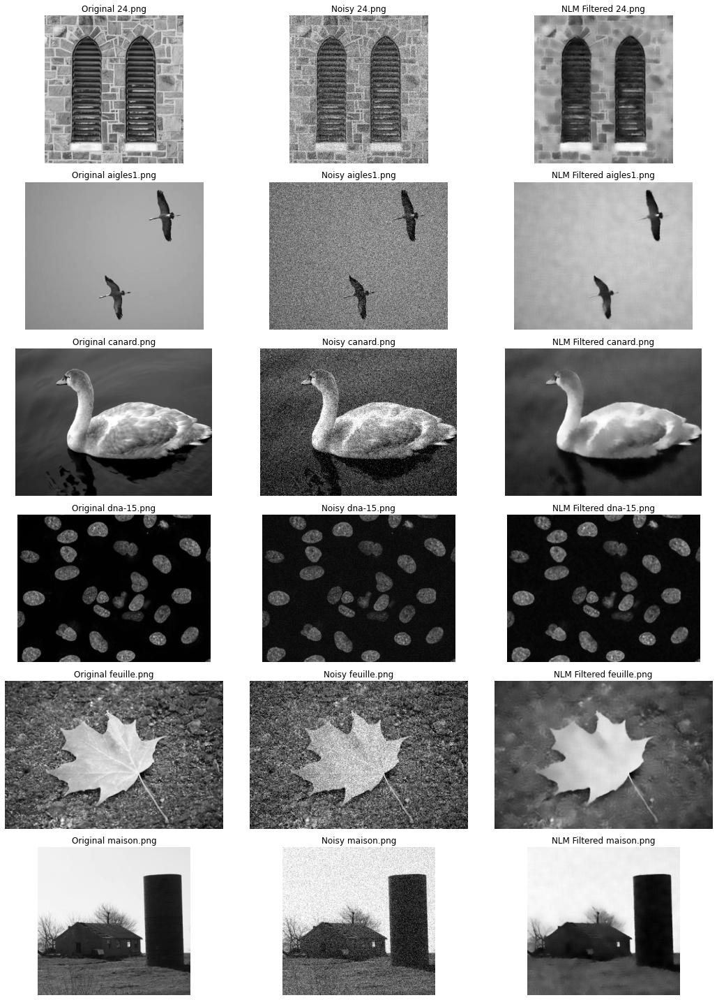

In [91]:
from skimage.restoration import denoise_nl_means, estimate_sigma

# Apply Non-Local Means (NLM) denoising filter to each noisy image
filtered_nlm_images = {}

# Since NLM works on float images, we need to normalize the noisy images
for name, noisy_image in gaussian_noisy_images.items():
    # Normalize the noisy image to be between 0 and 1
    noisy_image_norm = noisy_image / 255.0
    
    # Estimate the noise standard deviation from the noisy image
    sigma_est = np.mean(estimate_sigma(noisy_image_norm, multichannel=False))
    
    # Apply Non-Local Means Denoising
    patch_kw = dict(patch_size=5,      # 5x5 patches
                    patch_distance=6,  # 13x13 search area
                    multichannel=False)
    nlm_image = denoise_nl_means(noisy_image_norm, h=1.15 * sigma_est, sigma=sigma_est, fast_mode=True, **patch_kw)
    
    # Scale back to 0-255 and convert to uint8
    nlm_image_uint8 = np.clip(nlm_image * 255, 0, 255).astype('uint8')
    
    filtered_nlm_images[name] = nlm_image_uint8

# Display each original, noisy, and NLM filtered image side by side
fig, axes = plt.subplots(len(images), 3, figsize=(15, 20))

for i, (name, image) in enumerate(images.items()):
    # Original image
    if len(image.shape) == 2:  # If grayscale
        axes[i, 0].imshow(image, cmap='gray')
    else:  # If color, convert to grayscale for display
        axes[i, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY), cmap='gray')
    axes[i, 0].set_title(f'Original {name}')
    axes[i, 0].axis('off')
    
    # Noisy image
    axes[i, 1].imshow(gaussian_noisy_images[name], cmap='gray')
    axes[i, 1].set_title(f'Noisy {name}')
    axes[i, 1].axis('off')
    
    # NLM filtered image
    axes[i, 2].imshow(filtered_nlm_images[name], cmap='gray')
    axes[i, 2].set_title(f'NLM Filtered {name}')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


### Calcule PSNR et MSE de filtre NLM 

In [94]:
# Calculate PSNR and MSE for each image
psnr_values_NLM = {}
mse_values_NLM = {}

for name, original_image in images.items():
    original_gray = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY) if len(original_image.shape) > 2 else original_image
    denoised_image_NLM = filtered_nlm_images[name]
    psnr_values_NLM [name] = psnr(original_gray, denoised_image_NLM)
    mse_values_NLM [name] = mse(original_gray, denoised_image_NLM)

# Display the PSNR and MSE values for each image
for name in images.keys():
    print(f"{name}: PSNR_NLM = {psnr_values_NLM [name]:.2f}, MSE_NLM = {mse_values_NLM [name]:.2f}")

24.png: PSNR_NLM = 29.40, MSE_NLM = 74.63
aigles1.png: PSNR_NLM = 38.51, MSE_NLM = 9.15
canard.png: PSNR_NLM = 32.67, MSE_NLM = 35.13
dna-15.png: PSNR_NLM = 29.77, MSE_NLM = 68.62
feuille.png: PSNR_NLM = 29.19, MSE_NLM = 78.29
maison.png: PSNR_NLM = 32.27, MSE_NLM = 38.53


Le tableau ci-dissous présente les valeurs de PSNR et MSE obtenues à l'aide de différents filtres, illustrant ainsi l'efficacité de chacun en termes de réduction du bruit et de préservation de la qualité de l'image.

In [97]:
import pandas as pd

# Assuming psnr_values_gauss, mse_values_gauss, psnr_values_median, mse_values_median, psnr_values_NLM, mse_values_NLM
# are already populated as shown in your code snippets.

# Prepare the data for DataFrame
data = []
for name in images.keys():
    data.append({
        'Image': name,
        'PSNR_Gauss': psnr_values_gauss[name],
        'MSE_Gauss': mse_values_gauss[name],
        'PSNR_Median': psnr_values_median[name],
        'MSE_Median': mse_values_median[name],
        'PSNR_NLM': psnr_values_NLM[name],
        'MSE_NLM': mse_values_NLM[name]
    })

# Create DataFrame
df = pd.DataFrame(data)

# Set image name as index
df.set_index('Image', inplace=True)

# Display the DataFrame
print(df)


             PSNR_Gauss  MSE_Gauss  PSNR_Median  MSE_Median   PSNR_NLM  \
Image                                                                    
24.png        28.997189  81.914634    29.465234   73.545650  29.401898   
aigles1.png   29.019066  81.503038    30.096095   63.602016  38.514265   
canard.png    29.123612  79.564459    30.099064   63.558548  32.674293   
dna-15.png    30.269182  61.117024    32.173446   39.421736  29.766258   
feuille.png   28.955514  82.704466    29.182865   78.486305  29.193634   
maison.png    29.256264  77.170966    29.844472   67.395851  32.272820   

               MSE_NLM  
Image                   
24.png       74.626064  
aigles1.png   9.154906  
canard.png   35.127807  
dna-15.png   68.620611  
feuille.png  78.291921  
maison.png   38.529943  


## Analyse des résultats 

Les valeurs PSNR (Peak Signal to Noise Ratio) et MSE (Mean Squared Error) sont des mesures couramment utilisées pour évaluer la qualité d'une image ou l'efficacité d'un processus de débruitage.
- PSNR : Plus le PSNR est élevé, meilleure est la qualité de l'image par rapport à l'original. Une valeur PSNR élevée indique que le bruit est moins perceptible.

- MSE : Plus le MSE est bas, plus l'image débruitée est proche de l'image originale. Une valeur MSE faible indique une petite erreur quadratique moyenne entre l'image débruitée et l'originale.
#### Filtre Gaussien
Les valeurs de PSNR et MSE pour le filtre Gaussien sont relativement homogènes à travers les images. Ce filtre est efficace pour réduire le bruit gaussien, mais il peut estomper les détails fins de l'image.
#### Filtre Médian
Le filtre Médian présente des valeurs de PSNR généralement plus élevées et des valeurs de MSE plus basses par rapport au filtre Gaussien, ce qui suggère une amélioration dans la réduction du bruit, notamment pour le bruit de type sel et poivre. Ce filtre préserve mieux les bords et les détails que le filtre Gaussien.
#### Filtre NLM (Non-Local Means)
Le filtre NLM montre une amélioration significative de la qualité de l'image pour certaines images (par exemple, aigles1.png avec un PSNR = 38.51 beaucoup plus élevé et un MSE = 9.15 beaucoup plus bas) mais est moins constant sur d'autres. Cela indique que le filtre NLM est particulièrement efficace pour certains types d'images ou de bruit, offrant un bon compromis entre la réduction du bruit et la préservation des détails. Cependant, son efficacité peut varier selon le contenu de l'image et la nature du bruit.

### Interprétation

- Les filtres médian et NLM semblent offrir de meilleures performances en termes de réduction du bruit tout en préservant la qualité de l'image comparativement au filtre Gaussien, avec le filtre NLM qui excelle particulièrement sur certaines images.
- L'efficacité d'un filtre dépend fortement de la nature de l'image et du type de bruit. Le choix du filtre doit donc être adapté au contexte spécifique.
- Le filtre NLM semble être le plus performant en termes de préservation des détails et de réduction du bruit pour les images où il excelle, mais sa performance plus variable nécessite une évaluation au cas par cas.